In [128]:
#@title Cài đặt kiểm tra môi trường và tải mã nguồn để lấy dữ liệu
# Kiểm tra hiện tại có phải đang ở trong colaboratory hay không
import sys

IN_COLAB = "google.colab" in sys.modules

if IN_COLAB:
    !git clone https://github.com/HoanChan/TableVision.git TableVision
else:
    print("Running on Local")

Running on Local


<Figure size 1000x2000 with 0 Axes>

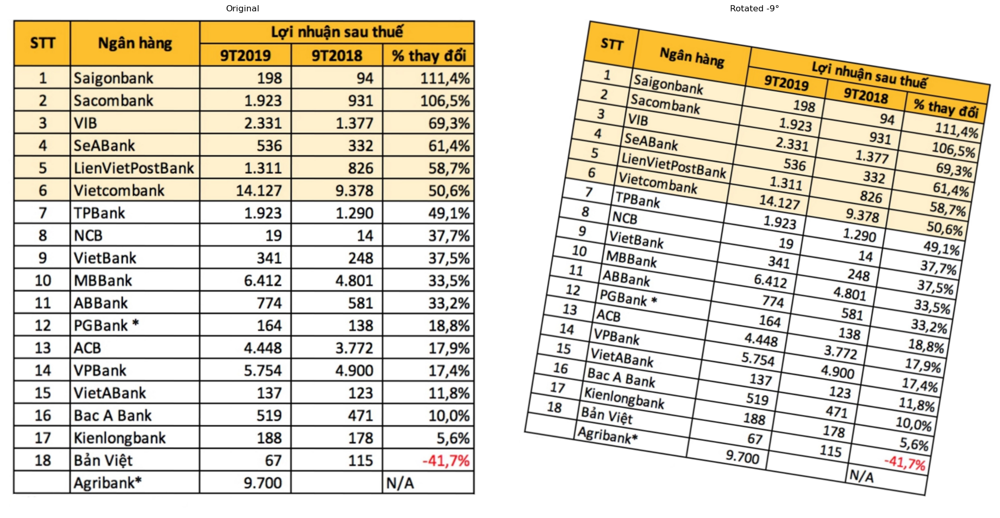

In [129]:
#@title Hàm hiển thị ảnh và xoay ảnh ngẫu nhiên để tạo đầu vào
import cv2
import random
import numpy as np
from matplotlib import pyplot as plt
def display_images_with_labels(image_labels, layout, size=(10, 10), show_axis=True):
    """
    Hiển thị các ảnh cùng với nhãn bằng matplotlib.pyplot.

    Tham số:
    - image_labels: Danh sách các tuple (ảnh, nhãn) cần hiển thị.
    - layout: Tuple (rows, columns) chỉ định cách bố trí ảnh trên lưới.
    - size: Tuple (width, height) chỉ định kích thước của mỗi ảnh.
    - show_axis: Bool, xác định xem có hiển thị trục hay không.
    """
    rows, columns = layout
    total_images = len(image_labels)

    # Tính số lượng ảnh cần thêm vào để điền đầy lưới
    num_padding = rows * columns - total_images

    # Thêm ảnh trống vào danh sách nếu cần
    image_labels += [(None, None)] * num_padding

    # Tạo subplot với tỉ lệ cố định
    fig, axes = plt.subplots(rows, columns, figsize=(size[0]*columns, size[1]*rows), subplot_kw={'aspect': 'equal'})

    # Hiển thị ảnh cùng với nhãn trên các ô subplot
    for i, (image, label) in enumerate(image_labels):
        ax = axes.flat[i]
        if image is not None:
            # Chuyển đổi màu từ BGR sang RGB để hiển thị đúng
            image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            ax.imshow(image_rgb)
        if label is not None:
            ax.set_title(label)
        if not show_axis:
            ax.axis("off")

    plt.tight_layout()
    plt.show()
    
def rotate_image(image, angle):
    # Xác định kích thước ảnh
    height, width = image.shape[:2]

    # Tính toán ma trận xoay
    rotation_matrix = cv2.getRotationMatrix2D((width/2, height/2), angle, 1)

    # Tính toán kích thước mới của ảnh sau khi xoay
    cos = np.abs(rotation_matrix[0, 0])
    sin = np.abs(rotation_matrix[0, 1])
    new_width = int((height * sin) + (width * cos))
    new_height = int((height * cos) + (width * sin))

    # Cập nhật ma trận xoay để điều chỉnh kích thước ảnh
    rotation_matrix[0, 2] += (new_width / 2) - (width / 2)
    rotation_matrix[1, 2] += (new_height / 2) - (height / 2)

    # Thực hiện xoay và điều chỉnh kích thước ảnh
    rotated_image = cv2.warpAffine(image, rotation_matrix, (new_width, new_height), borderMode=cv2.BORDER_CONSTANT, borderValue=(255, 255, 255))
    return rotated_image

prePath = "/content/TableVision/" if IN_COLAB else ""
image_path=prePath + "sample/xx2.jpg"
image = cv2.imread(image_path)
# resize về width = 1000
scale_percent = 1000 / image.shape[1]
width = int(image.shape[1] * scale_percent)
height = int(image.shape[0] * scale_percent)
image = cv2.resize(image, (width, height), interpolation=cv2.INTER_AREA)
# xoay ảnh ngẫu nhiên
angle = random.randint(-30, 30)
rotated_image = rotate_image(image, angle)
# thiết lập kích thước hiển thị ảnh
plt.figure(figsize=(10, 20))
# hiển thị ảnh gốc và ảnh đã xoay
display_images_with_labels([(image, "Original"), (rotated_image, f"Rotated {str(angle)}°")], (1, 2), show_axis=False)

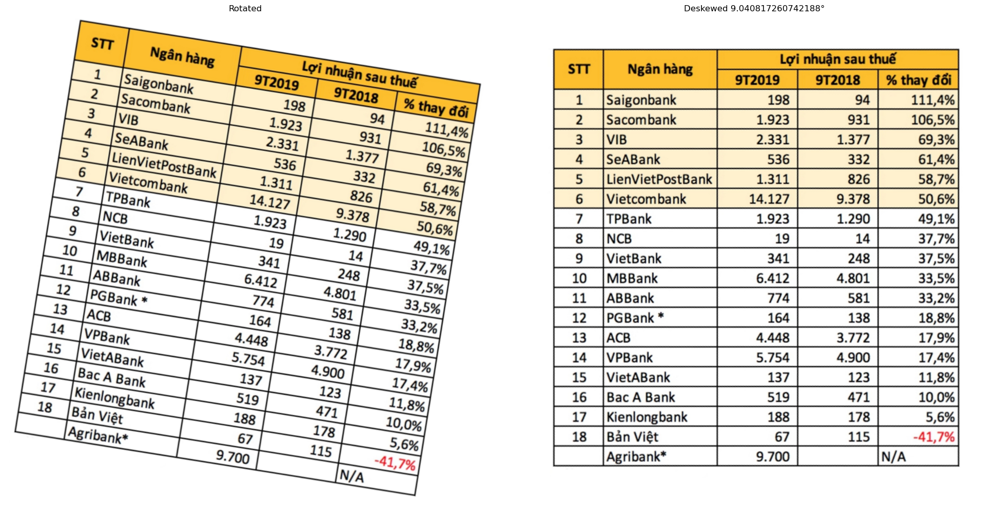

In [130]:
#@title Làm chỉnh sửa góc nghiêng
def deskew_image(image):
    """
    Chỉnh sửa góc nghiêng của ảnh.

    Tham số:
    - image: Ảnh cần chỉnh sửa góc nghiêng.

    Kết quả:
    - deskewed_image: Ảnh đã chỉnh sửa góc nghiêng.
    - angle: Góc nghiêng của ảnh.
    """
    # Làm mờ ảnh để loại bỏ nhiễu
    blur_image = cv2.medianBlur(image, 5)

    # Chuyển đổi sang ảnh grayscale và đảo ngược màu
    grayscale_image = cv2.bitwise_not(cv2.cvtColor(image, cv2.COLOR_BGR2GRAY))

    # Xác định ngưỡng 
    _, threshold_image = cv2.threshold(grayscale_image, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)

    # Tìm tọa độ các điểm ảnh khác 0 (điểm ảnh màu trắng)
    coordinates = np.column_stack(np.where(threshold_image > 0))

    # Xác định góc xoay của ảnh
    angle = cv2.minAreaRect(coordinates)[-1]
    if angle < -45:
        angle = -(90 + angle)
    elif angle > 45:
        angle = 90 - angle
    else:
        angle = -angle

    # Xoay ảnh để chỉnh sửa góc nghiêng và điều chỉnh kích thước ảnh để xoay không bị cắt ảnh
    height, width = blur_image.shape[:2]
    center = (width // 2, height // 2)
    rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
    deskewed_image = cv2.warpAffine(image, rotation_matrix, (width, height), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)

    return deskewed_image, angle

image_deskew, calc_angle = deskew_image(rotated_image)
display_images_with_labels([(rotated_image, "Rotated"), (image_deskew, f"Deskewed {str(calc_angle)}°")], (1, 2), show_axis=False)

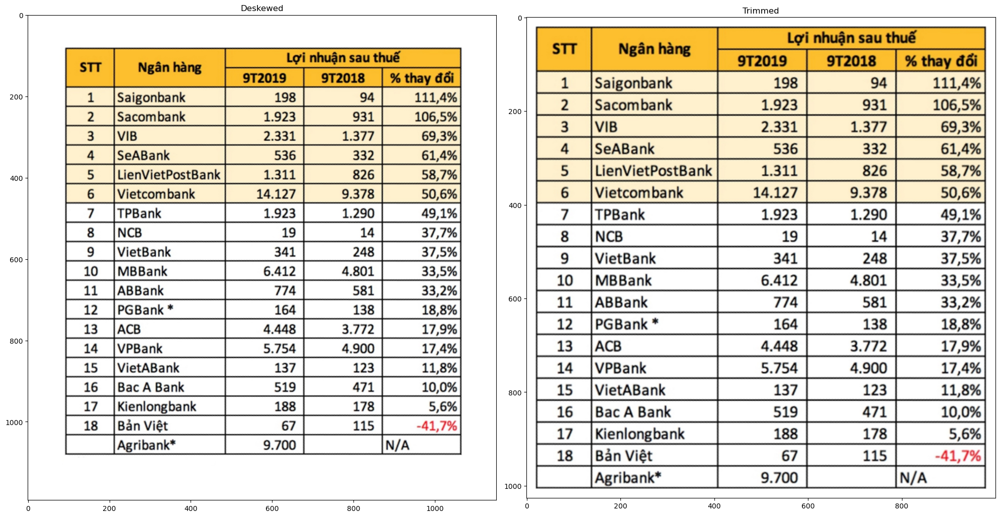

In [131]:
def trim_white(image):
    # Chuyển đổi ảnh sang không gian màu xám
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Áp dụng ngưỡng nhị phân để tạo mask chỉ chứa các điểm ảnh trắng
    _, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)

    # Tìm các chỉ số hàng và cột không chứa giá trị 0 (màu trắng) đầu tiên
    rows = np.where(np.any(thresh != 0, axis=1))[0]
    cols = np.where(np.any(thresh != 0, axis=0))[0]

    # Tính toán các giới hạn của bounding box
    y1, y2 = rows[0], rows[-1] + 1
    x1, x2 = cols[0], cols[-1] + 1

    # Cắt và trả về phần ảnh đã được trim
    trimmed_image = image[y1:y2, x1:x2]

    # Thêm 20 pixel vào mỗi cạnh để tránh việc cắt bớt các ký tự
    trimmed_image = cv2.copyMakeBorder(trimmed_image, 20, 20, 20, 20, cv2.BORDER_CONSTANT, value=(255, 255, 255))

    # resize về width = 1000
    scale_percent = 1000 / trimmed_image.shape[1]
    width = int(trimmed_image.shape[1] * scale_percent)
    height = int(trimmed_image.shape[0] * scale_percent)
    trimmed_image = cv2.resize(trimmed_image, (width, height), interpolation=cv2.INTER_AREA)

    return trimmed_image

image_ok = trim_white(image_deskew)
display_images_with_labels([(image_deskew, "Deskewed"), (image_ok, "Trimmed")], (1, 2), show_axis=True)

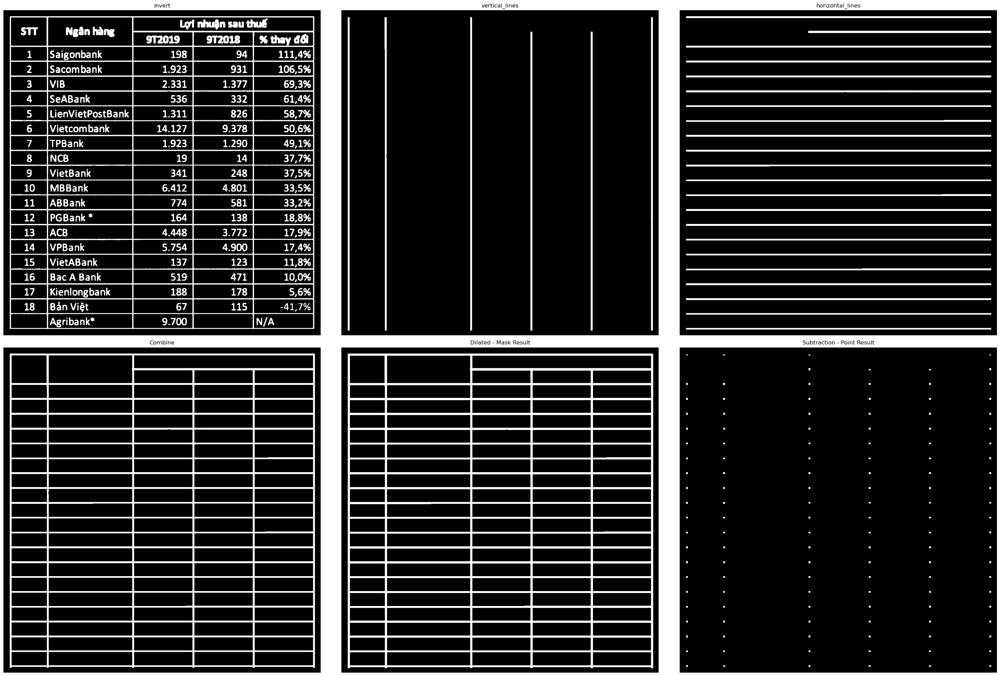

In [132]:
#@title Nhận diện cấu trúc bảng

def detect_lines(img_bin, fixkernel, detectkernel):
    """
    Phát hiện các đường thẳng trong ảnh bằng cách sử dụng các kernel được chỉ định.
    Cụ thể, ảnh được lấp đầy các khoảng trống với fixkernel.
    Sau đó loại bỏ các thành phần không phải đường thẳng với detectkernel.
    Cuối cùng là phục hồi lại như cũ với detectkernel.

    Tham số:
    - img_bin: Ảnh nhị phân.
    - fixkernel: Kernel được sử dụng để dilate (Bồi đắp các pixel màu trắng) để sửa lỗi.
    - detectkernel: Kernel được sử dụng để erode (Bào mòn các pixel màu trắng) và dilate nhằm giữ lại các đường.

    Kết quả:
    - result: Ảnh sau khi phát hiện các đường thẳng.
    """
    image_0 = cv2.dilate(img_bin, fixkernel, iterations=2)
    image_1 = cv2.erode(image_0, detectkernel, iterations=3)
    result = cv2.dilate(image_1, detectkernel, iterations=3)
    return result

def find_Lines(img):
    """
    Nhận diện cấu trúc bảng trong ảnh.

    Tham số:
    - img: Ảnh cần nhận diện cấu trúc.

    Kết quả:
    - img_vh: Ảnh chứa thông tin về các đường kẻ dọc và ngang (mask).
    - img_sub: Ảnh chứa thông tin các điểm giao nhau của các đường dọc và ngang.
    - outImag: Danh sách các ảnh trung gian.
    """    
    outImag=[]
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img_height, img_width = img.shape
    # THRESH_OTSU là phương pháp tự động xác định ngưỡng dựa trên histogram của ảnh
    thresh, img_bin = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)
    outImag.append((img_bin, 'invert'))

    # Giả sử bảng có tối đa 50 dòng và 30 cột
    kernel_len_ver = img_height // 50
    kernel_len_hor = img_width // 30
    # Defining a vertical kernel to detect all vertical lines of image
    ver_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, kernel_len_ver))

    # Defining a horizontal kernel to detect all horizontal lines of image
    hor_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (kernel_len_hor, 1))

    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (2, 2))

    vertical_lines = detect_lines(img_bin, kernel, ver_kernel)
    outImag.append((vertical_lines, 'vertical_lines'))

    horizontal_lines = detect_lines(img_bin, kernel, hor_kernel)
    outImag.append((horizontal_lines, 'horizontal_lines'))

    img_vh = cv2.bitwise_or(vertical_lines, horizontal_lines)
    outImag.append((img_vh, 'Combine'))

    img_vh = cv2.dilate(img_vh, kernel, iterations=1)
    outImag.append((img_vh, 'Dilated - Mask Result'))

    img_sub = cv2.bitwise_and(vertical_lines, horizontal_lines)
    outImag.append((img_sub, 'Subtraction - Point Result'))

    return img_vh, img_sub, outImag

mask, dots, outImag = find_Lines(image_ok)
num_cols = 3
num_rows = len(outImag) // num_cols if len(outImag) % num_cols == 0 else len(outImag) // num_cols + 1
display_images_with_labels(outImag, (num_rows, num_cols), show_axis=False)

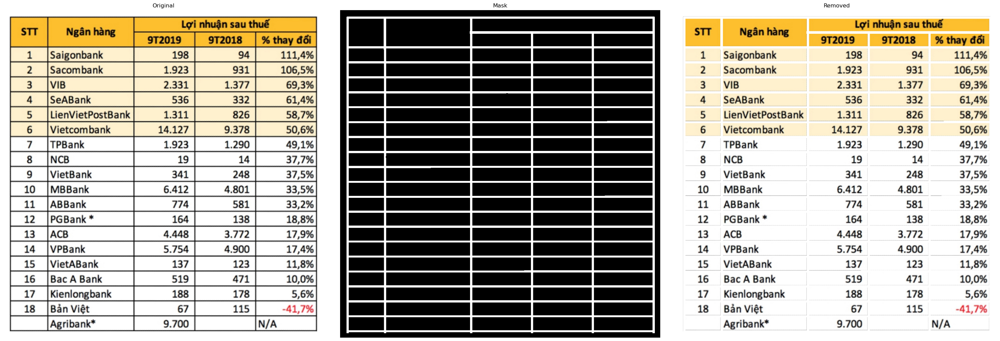

In [133]:
#@title Loại bỏ các vùng không cần thiết (cụ thể ở đây chính là các đường kẻ dọc và ngang) - Để cắt các ô bảng
def remove_regions(image, mask):
    """
    Loại bỏ các vùng trong ảnh sử dụng mặt nạ.

    Tham số:
    - image: Ảnh gốc.
    - mask: Mặt nạ có kích thước giống với ảnh, với giá trị 0 ở các vùng cần loại bỏ và 1 ở các vùng khác.

    Trả về:
    - Ảnh đã loại bỏ các vùng cần loại bỏ.
    """
    masked_image = image.copy()
    masked_image[mask != 0] = [255, 255, 255]
    return masked_image

image_removed = remove_regions(image_ok, mask)
display_images_with_labels([(image_ok, "Original"), (mask,'Mask'), (image_removed, "Removed")], (1, 3), show_axis=False)

In [134]:
# Vẽ văn bản vào trung tâm của các box (ở đây là cell)
def draw_text_in_center(img, text, box):
    x1, y1, x2, y2 = box

    center = (int((x1 + x2) / 2), int((y1 + y2) / 2))
    text_size, _ = cv2.getTextSize(text, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 1)
    text_width = text_size[0]
    text_height = text_size[1]
    text_origin = (center[0] - text_width // 2, center[1] + text_height // 2)

    cv2.putText(img, text, text_origin, cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 255), 1, cv2.LINE_AA)

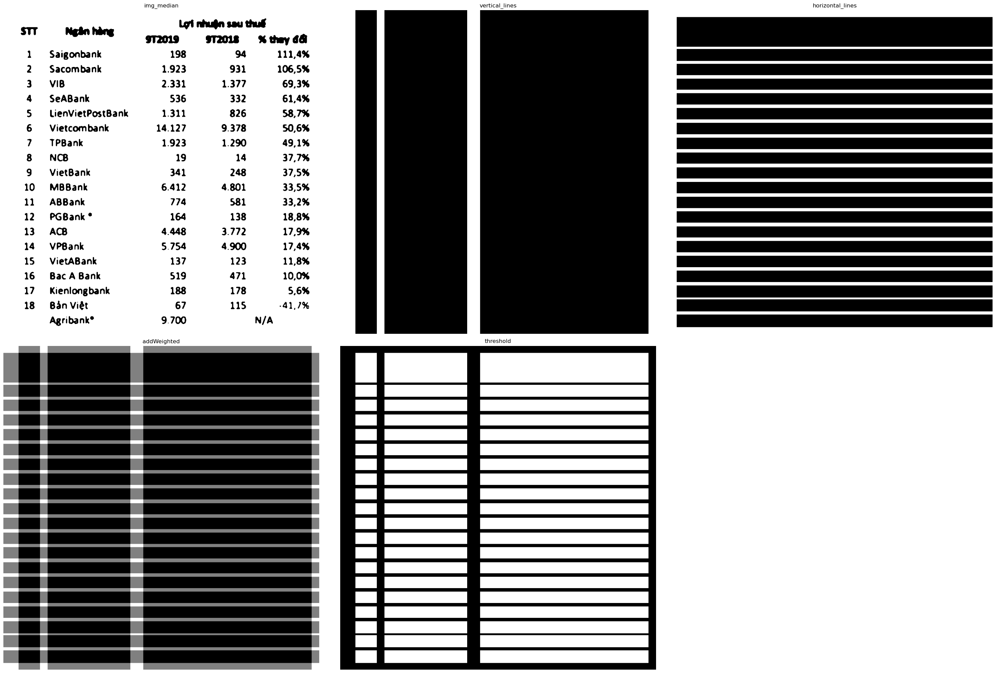

In [135]:
#@title Nhận diện cấu trúc bảng
import scipy.stats as stats

def find_Cells(image):    
    """
    Nhận diện cấu trúc bảng trong ảnh.

    Tham số:
    - image: Ảnh cần nhận diện cấu trúc.

    Kết quả:
    - img_vh: Ảnh chứa thông tin về các đường kẻ dọc và ngang (mask).
    - img_sub: Ảnh chứa thông tin các điểm giao nhau của các đường dọc và ngang.
    - outImag: Danh sách các ảnh trung gian.
    """    
    outImag=[]
    # outImag.append((image, 'image'))
    img_height, img_width = image.shape[:2]
    if img_height == 0 or img_width == 0:
        return [], [], image, outImag
    # THRESH_OTSU là phương pháp tự động xác định ngưỡng dựa trên histogram của ảnh
    img = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    thresh, img_bin = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
    # outImag.append((img_bin, 'invert'))
    try:
        img_median = cv2.medianBlur(img_bin, 5)
    except:
        img_median = img_bin
    outImag.append((img_median, 'img_median'))
    # img_median = img_bin
    ver_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (15, img_height*2)) #shape (kernel_len, 1) inverted! xD
    vertical_lines = cv2.erode(img_median, ver_kernel, iterations=1)
    outImag.append((vertical_lines, 'vertical_lines'))

    hor_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (img_width*2, 9)) #shape (kernel_len, 1) inverted! xD
    horizontal_lines = cv2.erode(img_median, hor_kernel, iterations=1)
    outImag.append((horizontal_lines, 'horizontal_lines'))
    # A kernel of 2x2
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (2, 2))

    # Combine horizontal and vertical lines in a new third image, with both having same weight.
    img_vh = cv2.addWeighted(vertical_lines, 0.5, horizontal_lines, 0.5, 0.0)
    outImag.append((img_vh, 'addWeighted'))

    # Eroding and thesholding the image
    # img_vh = cv2.erode(~img_vh, kernel, iterations=2)
    # outImag.append((img_vh, 'erode'))
    thresh, img_vh = cv2.threshold(img_vh, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)
    outImag.append((img_vh, 'threshold'))

    # Xác định các contours
    contours, hierarchy = cv2.findContours(img_vh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    # Sắp xếp các contours theo vị trí từ trên xuống dưới, từ trái qua phải
    contours = sorted(contours, key=lambda ctr: cv2.boundingRect(ctr)[1] * img_width + cv2.boundingRect(ctr)[0]) 

    return contours, img_vh, outImag

contours, mask, outImag = find_Cells(image_removed)
num_cols = 3
num_rows = len(outImag) // num_cols if len(outImag) % num_cols == 0 else len(outImag) // num_cols + 1
display_images_with_labels(outImag, (num_rows, num_cols), show_axis=False)

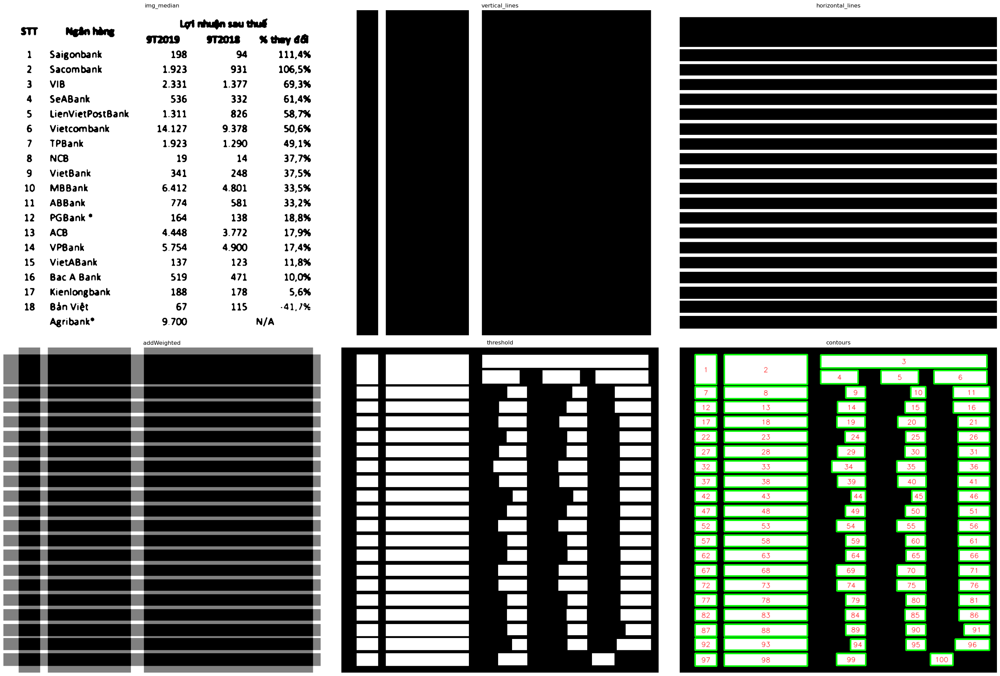

In [136]:
def CreateMask(image, level = 3):
    contours, mask, outImag = find_Cells(image)
    if level > 0:
        new_contours = []
        old_contours = []
        for contour in contours:
            x, y, w, h = cv2.boundingRect(contour)
            cell_img = image[y:y+h, x:x+w].copy()
            subcontours, submask, suboutImag = CreateMask(cell_img, level=level-1)
            if len(subcontours) >= 2:
                # cập nhật lại tọa độ của các contour con
                for subcontour in subcontours:
                    subcontour[:, :, 0] += x
                    subcontour[:, :, 1] += y
                new_contours.extend(subcontours)
                old_contours.append(contour)
                # Cập nhật lại mask bằng cách thay thế vùng cũ bằng vùng mới submask
                mask[y:y+h, x:x+w] = submask
                # outImag.extend([suboutImag[-2]])
        # Xóa các contour cũ và thêm các contour mới
        for contour in old_contours:
            for index, cnt in enumerate(contours):
                if np.array_equal(cnt, contour):
                    contours.pop(index)
                    break
        contours.extend(new_contours)
    return contours, mask, outImag

def draw_bboxs(image, bboxs, texts = lambda x: str(x)):    
    img_width = image.shape[1]
    # Sắp xếp các bboxs theo vị trí từ trên xuống dưới, từ trái qua phải
    bboxs = sorted(bboxs, key=lambda box: box[1] * img_width + box[0])    
    img_bboxs = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)
    # vẽ bboxs
    for index, box in enumerate(bboxs, start=1):
        cv2.rectangle(img_bboxs, box[:2], box[2:], (0, 255, 0), 3)
        draw_text_in_center(img_bboxs, texts(index), box)
    return img_bboxs

contours, mask, outImag = CreateMask(image_removed)
bboxs = [cv2.boundingRect(contour) for contour in contours]
# chuyển sang x1, y1, x2, y2
bboxs = [(x, y, x+w, y+h) for x, y, w, h in bboxs]
outImag.append((draw_bboxs(mask, bboxs), 'contours'))
num_cols = 3
num_rows = len(outImag) // num_cols if len(outImag) % num_cols == 0 else len(outImag) // num_cols + 1
display_images_with_labels(outImag, (num_rows, num_cols), show_axis=False)

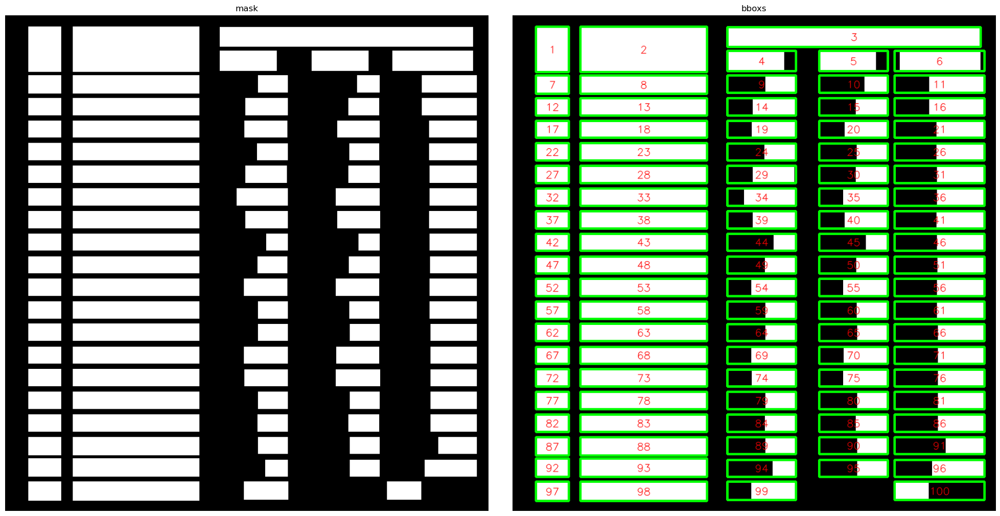

In [137]:
def isSameRow(bbox1, bbox2, row_threshold = 5):
    return not (bbox1[1] + row_threshold > bbox2[3] or bbox1[3] < bbox2[1] + row_threshold)

def isSameCol(bbox1, bbox2, col_threshold = 5):
    return not (bbox1[0] + col_threshold > bbox2[2] or bbox1[2] < bbox2[0] + col_threshold)

def make_same_width(bboxs, ratio_threshold = 2):
    xxbox = [box for box in bboxs]
    # Tạo danh sách chiều rộng của các bbox
    xxbox_width = [box[2] - box[0] for box in xxbox]
    # Tính tỉ lệ chiều rộng của các bbox với bbox khác
    ratios = []
    for i in range(len(xxbox)):
        ratio = [xxbox_width[i] / width for width in xxbox_width]
        ratios.append(ratio)
    ratios = [np.mean(ratio) for ratio in ratios]
    min_x1 = np.min([box[0] for i, box in enumerate(xxbox) if ratios[i] <= ratio_threshold])
    max_x2 = np.max([box[2] for i, box in enumerate(xxbox) if ratios[i] <= ratio_threshold])
    # làm cho tất cả các bbox có x1 = min_x1 và x2 = max_x2
    for i in range(len(xxbox)):
        if ratios[i] > ratio_threshold: continue
        xxbox[i] = (min_x1, xxbox[i][1], max_x2, xxbox[i][3])
    return xxbox, ratios
    
def fixBbox(bboxs, row_threshold = 10, col_threshold = 10):
    # Duyệt qua các bbox 
    _bboxs = [bbox for bbox in bboxs]
    col_check = [False for bbox in bboxs]
    row_check = [False for bbox in bboxs]

    for index, bbox in enumerate(_bboxs):
        if col_check[index]: continue
        other_bboxs = list(enumerate(_bboxs))        
        # Lập danh sách các bbox có vị trí nằm cùng cột với bbox hiện tại
        same_col_bboxs = []
        indexs = []
        
        for i, box in other_bboxs:
            if isSameCol(bbox, box, col_threshold):
                same_col_bboxs.append(box)
                indexs.append(i)

        # kiểm tra lại toàn bộ box trong same_col_bboxs có cùng cột với nhau không, nếu không thì bỏ qua
        isOK = True
        for i in range(len(same_col_bboxs)):
            for j in range(i+1, len(same_col_bboxs)):
                if not isSameCol(same_col_bboxs[i], same_col_bboxs[j], col_threshold):
                    isOK = False
                    break
            if not isOK: break
        if not isOK: continue 
        
        if len(same_col_bboxs) > 0: 
            same_col_bboxs, ratios = make_same_width(same_col_bboxs)
            # Cập nhật vào bboxs gốc
            for i in range(len(same_col_bboxs)):
                _bboxs[indexs[i]] = same_col_bboxs[i]
                col_check[indexs[i]] = True
            
        bbox_width = bbox[2] - bbox[0]
    return _bboxs

# chuyển sang dạng x1, y1, x2, y2
bboxs_span = list(fixBbox(bboxs, 10, 10))
boxs = bboxs_span
img_bboxs = draw_bboxs(mask, boxs)
display_images_with_labels([(mask,'mask'),(img_bboxs, 'bboxs')], (1, 2), show_axis=False)

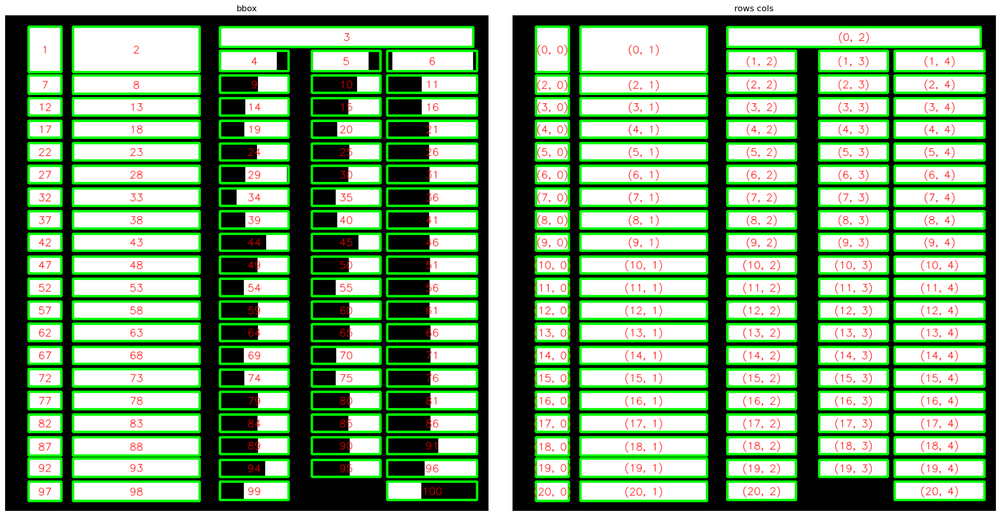

In [138]:
def split_rows_columns(centers, mode='row'):
    mode = 0 if mode == 'row' else 1
    centers.sort(key=lambda c: c[1-mode])  # Sắp xếp centers theo tọa độ y hoặc x tùy theo mode
    rows_columns = []
    current_row_column = [centers[0]]
    for center in centers[1:]:
        if abs(center[1-mode] - current_row_column[0][1-mode]) <= 10:  # Điểm y hoặc x gần nhau thuộc cùng một hàng hoặc cột
            current_row_column.append(center)
        else:  # Điểm y hoặc x xa, tạo hàng hoặc cột mới
            rows_columns.append(current_row_column)
            current_row_column = [center]
    rows_columns.append(current_row_column)  # Thêm hàng/cột cuối cùng
    # Sắp xếp lại các center trong mỗi hàng/cột theo tọa độ x hoặc y tùy theo mode
    for row_column in rows_columns:
        row_column.sort(key=lambda c: c[mode])
    return rows_columns

def split_box_rows_columns(bboxs, mode='row'):
    mode = 0 if mode == 'row' else 1
    bboxs.sort(key=lambda c: c[1-mode])  # Sắp xếp bboxs theo tọa độ y hoặc x tùy theo mode
    rows_columns = []
    current_row_column = [bboxs[0]]
    for box in bboxs[1:]:
        if (mode ==0 and isSameRow(box,current_row_column[0])) or (mode !=0 and isSameCol(box, current_row_column[0])):  # Điểm y hoặc x gần nhau thuộc cùng một hàng hoặc cột
            current_row_column.append(box)
        else:  # Điểm y hoặc x xa, tạo hàng hoặc cột mới
            rows_columns.append(current_row_column)
            current_row_column = [box]
    rows_columns.append(current_row_column)  # Thêm hàng/cột cuối cùng

    # Xử lý trường hợp rowspan/colspan 
    for row_column in rows_columns:
        tops = [box[:2] for box in row_column]
        cols = split_rows_columns(tops, 'row' if mode == 0 else 'col')
        # thay thế row_column bằng các phần tử của cols
        index = rows_columns.index(row_column)
        # lập danh sách các box dựa vào tops
        box_cols = [[box for box in row_column if box[:2] in col] for col in cols]
        if len(box_cols) > 1:
            # xóa row_column hiện tại
            rows_columns = rows_columns[:index] + box_cols + rows_columns[index+1:]
       
    # Sắp xếp lại các box trong mỗi hàng/cột theo tọa độ x hoặc y tùy theo mode
    for row_column in rows_columns:
        row_column.sort(key=lambda c: c[mode])
    return rows_columns

def create_mask_from_bboxs(image, bboxs):
    mask = np.zeros(image.shape[:2], dtype=np.uint8)
    for bbox in bboxs:
        x1, y1, x2, y2 = bbox
        mask[y1:y2, x1:x2] = 255
    return mask

def getbox_Index(box, rows, cols):
    for i, row in enumerate(rows):
        for j, col in enumerate(cols):
            if box in row and box in col:
                return i, j
    return -1, -1
 
cols = split_box_rows_columns(boxs, mode = 'col')       
rows = split_box_rows_columns(boxs, mode = 'row')
spans = [getbox_Index(box, rows, cols) for box in boxs]
new_mask = create_mask_from_bboxs(image_removed, boxs)
img_rows_cols = draw_bboxs(new_mask, boxs, lambda x: str(spans[x-1]))
display_images_with_labels([(img_bboxs,'bbox'),(img_rows_cols, 'rows cols')], (1, 2), show_axis=False)

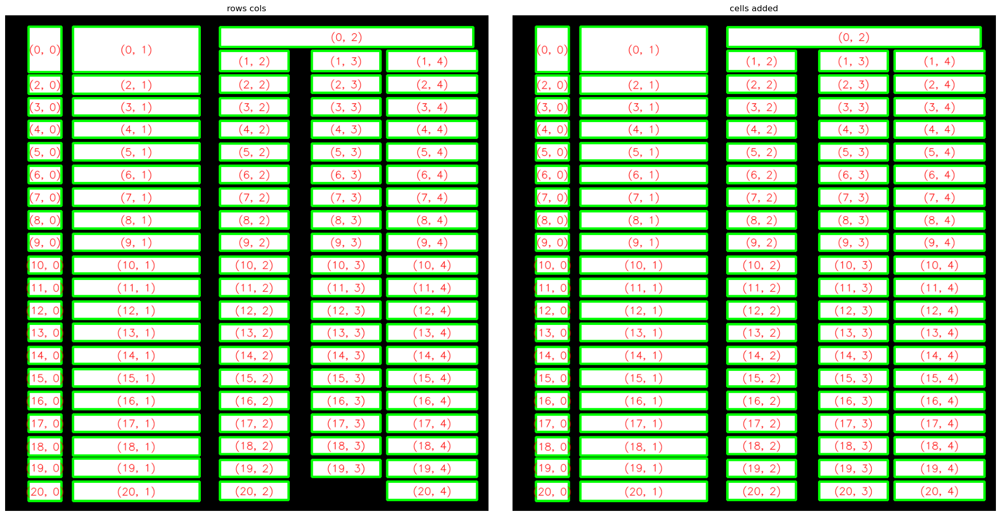

In [139]:
def check_bbox_overlap(bbox1, bbox2):
    x1_1, y1_1, x2_1, y2_1 = bbox1
    x1_2, y1_2, x2_2, y2_2 = bbox2
    if x2_2 < x1_1: return False # Kiểm tra xem bbox2 có nằm bên trái bbox1 hay không
    if x1_2 > x2_1: return False # Kiểm tra xem bbox2 có nằm bên phải bbox1 hay không
    if y2_2 < y1_1: return False # Kiểm tra xem bbox2 có nằm phía trên bbox1 hay không
    if y1_2 > y2_1: return False # Kiểm tra xem bbox2 có nằm phía dưới bbox1 hay không
    return True # Nếu không thoả mãn các điều kiện trên, hai bbox chồng lên nhau
    
def add_missing_cells(bboxs, rows, cols, spans):
    matrix = [[None for col in cols] for row in rows]
    for index, span in enumerate(spans):
        matrix[span[0]][span[1]] = index
    # Duyệt qua toàn bộ matrix, nếu có ô nào là None thì thêm vào bboxs
    for i, row in enumerate(matrix):
        for j, cell in enumerate(row):
            if cell is None:
                row_height = rows[i][-1][3] - rows[i][-1][1]
                col_width = cols[j][-1][2] - cols[j][-1][0]
                cel_x1, cel_y1 = cols[j][-1][0], rows[i][-1][1]
                cel_x2, cel_y2 = cel_x1 + col_width, cel_y1 + row_height
                # tạo bbox mới
                new_bbox = (cel_x1, cel_y1, cel_x2, cel_y2)
                # kiểm tra xem bbox mới có nằm chồng lên bbox cùng hàng hoặc cùng cột không dựa vào x1, y1, x2, y2 của nó                
                isOverlap = False
                for box in cols[j]:
                    if check_bbox_overlap(new_bbox, box):
                        isOverlap = True
                        break
                for box in rows[i]:
                    if check_bbox_overlap(new_bbox, box):
                        isOverlap = True
                        break
                if isOverlap: continue
                bboxs.append(new_bbox)
                # cập nhật lại rows, cols, spans
                rows[i].append(new_bbox)
                cols[j].append(new_bbox)
                spans.append((i, j))
    #sắp xếp lại bboxs và spans theo bbox
    bboxs = sorted(bboxs, key=lambda box: box[1] * image_removed.shape[1] + box[0])
    spans = [getbox_Index(box, rows, cols) for box in bboxs]
    return bboxs, rows, cols, spans

boxs, rows, cols, spans = add_missing_cells(boxs, rows, cols, spans)
new_mask = create_mask_from_bboxs(image_removed, boxs)
img_cells_added = draw_bboxs(new_mask, boxs, lambda x: str(spans[x-1]))
display_images_with_labels([(img_rows_cols, 'rows cols'),(img_cells_added, 'cells added')], (1, 2), show_axis=False)

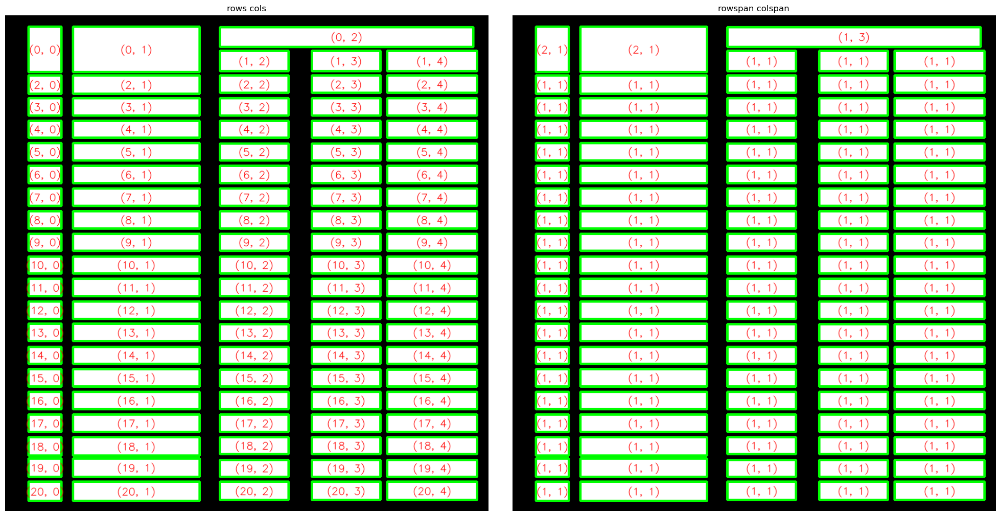

In [148]:
def createSpanMatrix(rows, cols, spans):
    matrix = [[None for col in cols] for row in rows]
    for index, span in enumerate(spans):
        matrix[span[0]][span[1]] = index
    #duyệt qua các phần tử của matrix
    for i in range(len(matrix)):
        for j in range(len(matrix[i])):
            if matrix[i][j] is None: continue
            box_index = matrix[i][j]
            # tính rowspan và colspan
            rowspan = 1
            colspan = 1
            for k in range(i+1, len(matrix)):
                if matrix[k][j] is None: rowspan += 1
                else: break
            for k in range(j+1, len(matrix[i])):
                if matrix[i][k] is None: colspan += 1
                else: break
            matrix[i][j] = (box_index, rowspan, colspan)
    return matrix

matrix = createSpanMatrix(rows, cols, spans)
img_span = draw_bboxs(new_mask, boxs, lambda x: str(matrix[spans[x-1][0]][spans[x-1][1]][1:]))
display_images_with_labels([(img_cells_added, 'rows cols'),(img_span, 'rowspan colspan')], (1, 2), show_axis=False)

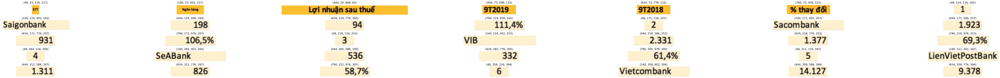

In [141]:
#@title Tạo cells và cắt các ô bảng theo các cell
# Tạo cells từ bboxs, rows, cols, spans, matrix
#cell = {'bbox': bbox, 'row_span': row_span, 'col_span': col_span, 'row':row_index, 'col':col_index}
def createCells(bboxs, rows, cols, spans, matrix):
    cells = []
    for index, bbox in enumerate(bboxs):
        row_index, col_index = spans[index]
        row_span, col_span = matrix[row_index][col_index][1:]
        cell = {'bbox': bbox, 'row_span': row_span, 'col_span': col_span, 'row':row_index, 'col':col_index}
        cells.append(cell)
    return cells

cells = createCells(boxs, rows, cols, spans, matrix)
cells_imgs = []
for cell in cells:
    x1,y1,x2,y2 = cell['bbox']
    cropped_image = image_removed[int(y1):int(y2), int(x1):int(x2)]
    cells_imgs += [(cropped_image, cell['bbox'])]

display_images_with_labels(cells_imgs[:35], layout = (5, 7), size = (10, 1), show_axis=False)

In [142]:
#@title Cài đặt thư viện nhận diện văn bản
#Kiểm tra hiện tại đã cài đặt thư viện hay chưa
try:
    from vietocr.tool.predictor import Predictor
    print("Đã cài đặt thư viện nhận diện văn bản")
except ModuleNotFoundError:
    print("Đang cài đặt thư viện nhận diện văn bản...")
    ! pip install --quiet vietocr
finally:
    from vietocr.tool.predictor import Predictor
    from vietocr.tool.config import Cfg
    config = Cfg.load_config_from_name('vgg_seq2seq')
    # config['weights'] = './weights/transformerocr.pth'
    # config['weights'] = 'https://drive.google.com/uc?id=13327Y1tz1ohsm5YZMyXVMPIOjoOA0OaA'
    config['cnn']['pretrained']=False
    config['device'] = 'cpu'
    config['predictor']['beamsearch']=False
    detector = Predictor(config)

Đã cài đặt thư viện nhận diện văn bản


d:\SOFTS\Anacoda\envs\Tensor\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\SOFTS\Anacoda\envs\Tensor\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Model weight C:\Users\LHONCH~1\AppData\Local\Temp\vgg_seq2seq.pth exsits. Ignore download!


Saigonbank


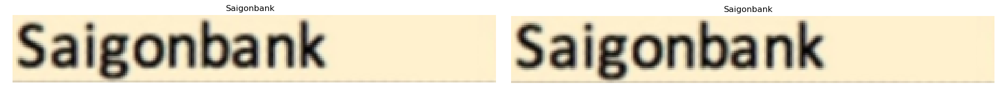

In [143]:
#@title Nhận diện văn bản trong các ô bảng

from PIL import Image

def process_image(image):
    """
    Cắt các dòng văn bản từ ảnh.

    Tham số:
    - image: Ảnh cần xử lý.

    Trả về:
    - images: Danh sách các dòng văn bản đã cắt được.
    """
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, bw = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY_INV)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 1))
    dilated = cv2.dilate(bw, kernel, iterations=10) # mở rộng để lấp đầy hàng
    # return [dilated]
    contours, _ = cv2.findContours(dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    images = []
    # img_cnt = image.copy()
    for cnt in contours:
        area = cv2.contourArea(cnt)
        x, y, w, h = cv2.boundingRect(cnt)
        if area > 100 and w > h and h > 5:
            # cv2.drawContours(img_cnt, contours, -1, (0, w%255, 0), 2)
            cropped = image[y-3:y+h+3, x:]
            images+=[cropped]
    # return [img_cnt]
    if len(images) == 0:
        return []
    # Tìm độ cao lớn nhất của các ảnh
    max_height = max([img.shape[0] for img in images])
    # xoá các image có độ cao nhỏ hơn nhiều so với max_height
    images = [img for img in images if img.shape[0] > max_height / 2]
    return images[::-1]

def detectText(image):
  """
  Nhận diện văn bản trong ảnh.

  Tham số:
  - image: Ảnh cần nhận diện văn bản.

  Trả về:
  - texts: Danh sách các dòng văn bản đã nhận diện được.
  """
  lines = process_image(image)
  if len(lines) == 0:
    return "", lines
  texts = []
  for line in lines:
    try:
      image = Image.fromarray(cv2.cvtColor(line, cv2.COLOR_BGR2RGB))
      text = detector.predict(image)
      texts.append(text)
    except:
      texts.append('')
  texts = '\n'.join(texts)
  return texts , lines

img = cells_imgs[7][0]
text, lines = detectText(img)
print(text)
display_images_with_labels([(img, text)] + list(zip(lines, text.split('\n'))), (1, len(lines)+1), show_axis=False)

In [144]:
#@title Nhận diện văn bản trong tất cả các ô bảng

texts = []
for cell in cells_imgs:
  img, bbox = cell
  text, lines = detectText(img)
  texts += [text]

print(texts, sep='\n')

['STT', 'Ngân hàng', 'Lợi nhuận sau thuế', '9T2019', '9T2018', '% thay đổi', '1', 'Saigonbank', '198', '94', '111,4%', '2', 'Sacombank', '1.923', '931', '106,5%', '3', 'VIB', '2.331', '1.377', '69,3%', '4', 'SeABank', '536', '332', '61,4%', '5', 'LienVietPostBank', '1.311', '826', '58,7%', '6', 'Vietcombank', '14.127', '9.378', '50,6%', '7', 'TPBank', '1.923', '1.290', '49,1%', '8', 'NCB', '19', '14', '37,7%', '9', 'VietBank', '341', '248', '37,5%', '10', 'MBBank', '6.412', '4.801', '33,5%', '11', 'ABBank', '774', '581', '33,2%', '12', 'PGBANK 4 THU', '164', '138', '18,8%', '13', 'ACB', '4.448', '3.772', '17,9%', '14', 'VPBank', '5.754', '4.900', '17,4%', '15', 'VietABank', '137', '123', '11,8%', '16', 'Bac A Bank', '519', '471', '10,0%', '17', 'Kienlongbank', '188', '178', '5,6%', '18', 'Bản Việt', '67', '115', '41,7%', '', 'Agribanking', '9.700', '', 'N/A']


In [145]:
import xml.etree.ElementTree as ET
def cells_to_html(cells):

    table = ET.Element("table")
    current_row = -1

    for cell in cells:
        this_row = cell['row']

        attrib = {}
        colspan = cell['col_span']
        if colspan > 1:
            attrib['colspan'] = str(colspan)
        rowspan = cell['row_span']
        if rowspan > 1:
            attrib['rowspan'] = str(rowspan)
        if this_row > current_row:
            current_row = this_row
            if current_row == 0:
                cell_tag = "th"
                row = ET.SubElement(table, "thead")
            else:
                cell_tag = "td"
                row = ET.SubElement(table, "tr")
        tcell = ET.SubElement(row, cell_tag, attrib=attrib)
        tcell.text = cell['cell text']

    return str(ET.tostring(table, encoding="unicode", short_empty_elements=False))

cells_imgs = []
for i in range(len(cells)):
  cells[i]['cell text'] = texts[i]
html = cells_to_html(cells).replace('<thead>','<tr>').replace('</thead>','</tr>').replace('\n',"<br>")
html

'<table><tr><th rowspan="2">STT</th><th rowspan="2">Ngân hàng</th><th colspan="3">Lợi nhuận sau thuế</th></tr><tr><td>9T2019</td><td>9T2018</td><td>% thay đổi</td></tr><tr><td>1</td><td>Saigonbank</td><td>198</td><td>94</td><td>111,4%</td></tr><tr><td>2</td><td>Sacombank</td><td>1.923</td><td>931</td><td>106,5%</td></tr><tr><td>3</td><td>VIB</td><td>2.331</td><td>1.377</td><td>69,3%</td></tr><tr><td>4</td><td>SeABank</td><td>536</td><td>332</td><td>61,4%</td></tr><tr><td>5</td><td>LienVietPostBank</td><td>1.311</td><td>826</td><td>58,7%</td></tr><tr><td>6</td><td>Vietcombank</td><td>14.127</td><td>9.378</td><td>50,6%</td></tr><tr><td>7</td><td>TPBank</td><td>1.923</td><td>1.290</td><td>49,1%</td></tr><tr><td>8</td><td>NCB</td><td>19</td><td>14</td><td>37,7%</td></tr><tr><td>9</td><td>VietBank</td><td>341</td><td>248</td><td>37,5%</td></tr><tr><td>10</td><td>MBBank</td><td>6.412</td><td>4.801</td><td>33,5%</td></tr><tr><td>11</td><td>ABBank</td><td>774</td><td>581</td><td>33,2%</td></tr

In [146]:
from IPython.display import display, HTML

css = """
table {
  border-collapse: collapse;
  border-spacing: 0;
  width: 100%;
  font-family: sans-serif;
}

th, td {
  padding: 8px;
  text-align: center;
  vertical-align: middle;
}

th {
  font-weight: bold;
  font-size: 1.2em;
}

tr:nth-child(even) {
  background-color: rgba(68, 68, 68, 0.2);
}

table th, table td {
  border: 1px solid rgba(68, 68, 68, 0.5);
}
"""
body = """
<div style="display: flex;">
  <div style="flex: 1;">
    <img src='""" + image_path + """' alt="Ảnh" style="width: 90%;">
  </div>
  <div style="flex: 1;">""" + html + """</div>
</div>
"""
new_html = '<head><style>'+ css +'</style></head><body>'+ body + '</body>'

display(HTML(new_html))

In [147]:
def recognize(image_path): 
  image = cv2.imread(image_path)
  # resize về width = 1000
  scale_percent = 1000 / image.shape[1]
  width = int(image.shape[1] * scale_percent)
  height = int(image.shape[0] * scale_percent)
  image = cv2.resize(image, (width, height), interpolation=cv2.INTER_AREA)
  image_deskew, calc_angle = deskew_image(image)
  image_ok = trim_white(image_deskew)
  mask, dots, outImag = find_Lines(image_ok)
  image_removed = remove_regions(image_ok, mask)
  # contours, mask, outImag = find_Cells(image_removed)
  # image_removed = remove_regions(image_ok, mask)
  contours, mask, outImag = CreateMask(image_removed)
  bboxs = [cv2.boundingRect(contour) for contour in contours]
  # chuyển sang x1, y1, x2, y2
  bboxs = [(x, y, x+w, y+h) for x, y, w, h in bboxs]
  bboxs_span = list(fixBbox(bboxs, 10, 10))
  boxs = bboxs_span
  cols = split_box_rows_columns(boxs, mode = 'col')       
  rows = split_box_rows_columns(boxs, mode = 'row')
  spans = [getbox_Index(box, rows, cols) for box in boxs]
  boxs, rows, cols, spans = add_missing_cells(boxs, rows, cols, spans)
  matrix = createSpanMatrix(rows, cols, spans)
  cells = createCells(boxs, rows, cols, spans, matrix)
  cells_imgs = []
  for cell in cells:
      x1,y1,x2,y2 = cell['bbox']
      cropped_image = image_removed[int(y1):int(y2), int(x1):int(x2)]
      cells_imgs += [(cropped_image, cell['bbox'])]
  texts = []
  for cell in cells_imgs:
    img, bbox = cell
    text, lines = detectText(img)
    texts += [text]
  cells_imgs = []
  for i in range(len(cells)):
    cells[i]['cell text'] = texts[i]
  html = cells_to_html(cells).replace('<thead>','<tr>').replace('</thead>','</tr>').replace('\n',"<br>")

  css = """
  table {
    border-collapse: collapse;
    border-spacing: 0;
    width: 100%;
    font-family: sans-serif;
  }

  th, td {
    padding: 8px;
    text-align: center;
    vertical-align: middle;
  }

  th {
    font-weight: bold;
    font-size: 1.2em;
  }

  tr:nth-child(even) {
    background-color: rgba(68, 68, 68, 0.2);
  }

  table th, table td {
    border: 1px solid rgba(68, 68, 68, 0.5);
  }
  """
  body = """
  <div style="display: flex;">
    <div style="flex: 1;">
      <img src='""" + image_path + """' alt="Ảnh" style="width: 90%;">
    </div>
    <div style="flex: 1;">""" + html + """</div>
  </div>
  """
  new_html = '<head><style>'+ css +'</style></head><body>'+ body + '</body>'

  return new_html


prePath = "/content/TableVision/" if IN_COLAB else ""
display(HTML(recognize(prePath + "sample/vn6.jpg")))